In [3]:
CFG_PATH = '../configs/kl16_unet_single_content12.yaml'
CKPT_PATH = '../../results_multiscale_style/vgg_content12_time_ada_512/models/last.ckpt'

H = 256
W = 256
FACTOR = 16
DDIM_STEPS = 10
BS = 8

# DEVICE = 'cuda'
DEVICE = 'cpu'
SEED = 2023

In [ ]:
import sys
sys.path.append('../')

import os
import random
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from pytorch_lightning import seed_everything
from PIL import ImageDraw, ImageFont, Image
import matplotlib.pyplot as plt
from einops import rearrange
from omegaconf import OmegaConf
import albumentations

from main import instantiate_from_config
from ldm.models.diffusion.ddim import DDIMSampler

config = OmegaConf.load(CFG_PATH)
config.model.params.ckpt_path = CKPT_PATH
config.model.params.first_stage_config.params.ckpt_path = None
model = instantiate_from_config(config.model)
model = model.eval().to(DEVICE)
model.move_scaler_shift()

DualCondLDM: Running in eps-prediction mode
DualConditionDiffusionWrapper has 181.02 M params.
Keeping EMAs of 205.
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 16, 16, 16) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
Training DualCondLDM as an adaptive conditional model.
Keeping EMAs of 3.


In [ ]:
rescaler = albumentations.Resize(height=H, width=W)
rescaler_big = albumentations.Resize(height=H*2, width=W*2)

def preprocess_image(image_path, big=False):
    image = Image.open(image_path)
    if not image.mode == "RGB":
        image = image.convert("RGB")
    image = np.array(image).astype(np.uint8)
    if big:
        image = rescaler_big(image=image)["image"]
    else:
        image = rescaler(image=image)["image"]
    image = (image/127.5 - 1.0).astype(np.float32)
    image = rearrange(image, 'h w c -> c h w')
    return torch.from_numpy(image)


def display_samples(samples, n_columns=12, figsize=(10, 200)):
    samples = rearrange(samples, '(n m) c h w -> (m h) (n w) c', n=n_columns).cpu().numpy() * 255.
    samples = Image.fromarray(samples.astype(np.uint8))
    plt.rcParams["figure.figsize"] = figsize
    plt.imshow(samples)
    plt.axis('off')
    plt.show()
    
    return samples

def tensor_to_rgb(x):
    return torch.clamp((x + 1.0) / 2.0, min=0.0, max=1.0)

## Samples

In [4]:
def basename(path):
    return os.path.basename(path).split('.')[0]

In [5]:
style_paths = np.load('/ssd_data/datasets/test_style_transfer/style_paths.npy')[:1000]
content_paths = np.load('/ssd_data/datasets/test_style_transfer/content_paths.npy')[:1000]
output_path = '/ssd_data/datasets/test_style_transfer/artfusion/'

In [6]:
style_paths = ['/home/daryen/Downloads/sup/9771 (1)/50.jpg']
content_paths = ['/ssd_data/datasets/self_styletransfer_2/content/noise.jpg']
output_path = '../output_leak/'

In [13]:
import numpy as np
from tqdm import tqdm


DDIM_STEPS = 250

# content_s_list = [1,    1, 0.5]
# style_s_list =   [0.15, 1, 3]
content_s_list = [1, 0.5]
style_s_list =   [1, 3]
content_s_list = [0.1]
style_s_list =   [7,]
for content_s, style_s in zip(content_s_list, style_s_list):

    os.makedirs(os.path.join(output_path, f'c_{str(content_s)}_s_{str(style_s)}'), exist_ok=True)

    save_paths = list()
    with torch.no_grad():
        with model.ema_scope("Plotting"):
            for iter_i, (s_path, c_path) in tqdm(enumerate(zip(style_paths, content_paths))):
                save_path = os.path.join(output_path,
                                         f'c_{str(content_s)}_s_{str(style_s)}',
                                         f'{basename(c_path)}_stylized_{basename(s_path)}.jpg')
#                 if os.path.isfile(save_path):
#                     save_paths.append(save_path)
#                     continue
                
                style_image = preprocess_image(s_path)[None, :].to(DEVICE)
                content_image = preprocess_image(c_path)[None, :].to(DEVICE)

                vgg_features = model.vgg(model.vgg_scaling_layer(style_image))
                c_style = model.get_style_features(vgg_features)
                null_style = c_style.clone()
                null_style[:] = model.null_style_vector.weight[0]

                for _ in range(20):
                    content_encoder_posterior = model.encode_first_stage(content_image)[0]
                    content_encoder_posterior = model.get_first_stage_encoding(content_encoder_posterior)
                    c_content = model.get_content_features(content_encoder_posterior)
                    null_content = torch.zeros_like(c_content)

                    c = {'c1': c_content, 'c2': c_style}
                    c_null_style = {'c1': c_content, 'c2': null_style}
                    c_null_content = {'c1': null_content, 'c2': c_style}

                    sample = model.sample_log(
                        cond=c, batch_size=1, ddim=True,
                        ddim_steps=DDIM_STEPS, eta=1.,
            #             x_T=x_T,
                        unconditional_guidance_scale=content_s, unconditional_conditioning=c_null_content,
                        unconditional_guidance_scale_2=style_s, unconditional_conditioning_2=c_null_style)[0]

                    x_sample = model.decode_first_stage(sample)
                    content_image = x_sample
                    
                x_sample = tensor_to_rgb(x_sample) * 255
                x_sample = rearrange(x_sample[0], 'c h w -> h w c').cpu().numpy()[..., ::-1]

                
                cv2.imwrite(save_path, x_sample)
                save_paths.append(save_path)

#     save_paths = np.array(save_paths)
#     np.save(os.path.join(output_path, f'c_{str(content_s)}_s_{str(style_s)}_paths.npy'), save_paths)

Plotting: Switched to EMA weights


0it [00:00, ?it/s]

Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 72.12it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 68.99it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 69.97it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 69.88it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 69.40it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 69.23it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 70.65it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 70.83it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 69.84it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 70.24it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 69.41it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 69.80it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 67.67it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 70.75it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 71.32it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 70.95it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 69.39it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 70.81it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 70.60it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps



DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 70.19it/s]
1it [01:12, 72.04s/it]

Plotting: Restored training weights


## Style Visulization

In [4]:
style_dir = '/ssd_data/datasets/self_styletransfer_2/style/'

style_image_paths = [os.path.join(style_dir, p) for p in os.listdir(style_dir)][1:2]
style_images = torch.stack([preprocess_image(p) for p in style_image_paths], dim=0).to(DEVICE)

encoder_posterior = model.encode_first_stage(style_images)[0]
encoder_posterior = model.get_first_stage_encoding(encoder_posterior)
c_content = torch.zeros_like(encoder_posterior[:, :model.first_stage_model.embed_dim])

vgg_features = model.vgg(model.vgg_scaling_layer(style_images))
c_style = model.get_style_features(vgg_features)

c = {'c1': c_content, 'c2': c_style}

In [5]:
c_style.shape

torch.Size([1, 2944])

In [6]:
with torch.no_grad():
    with model.ema_scope("Plotting"):
        samples = model.sample_log(cond=c, batch_size=len(style_images), ddim=True, ddim_steps=DDIM_STEPS, eta=1.)[0]

        x_samples = model.decode_first_stage(samples)
        x_samples = tensor_to_rgb(x_samples)
        x = tensor_to_rgb(style_images)
        x = torch.cat([x, x_samples], dim=-2)

Plotting: Switched to EMA weights
Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 10 timesteps


DDIM Sampler: 100%|█████████████████████████████████████████████████████| 10/10 [00:02<00:00,  4.76it/s]


Plotting: Restored training weights


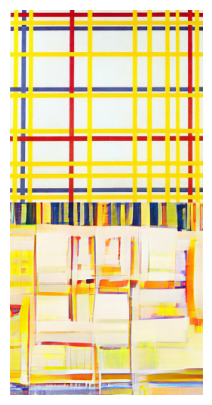

In [12]:
x_samples = display_samples(x, figsize=(10, 5), n_columns=1)

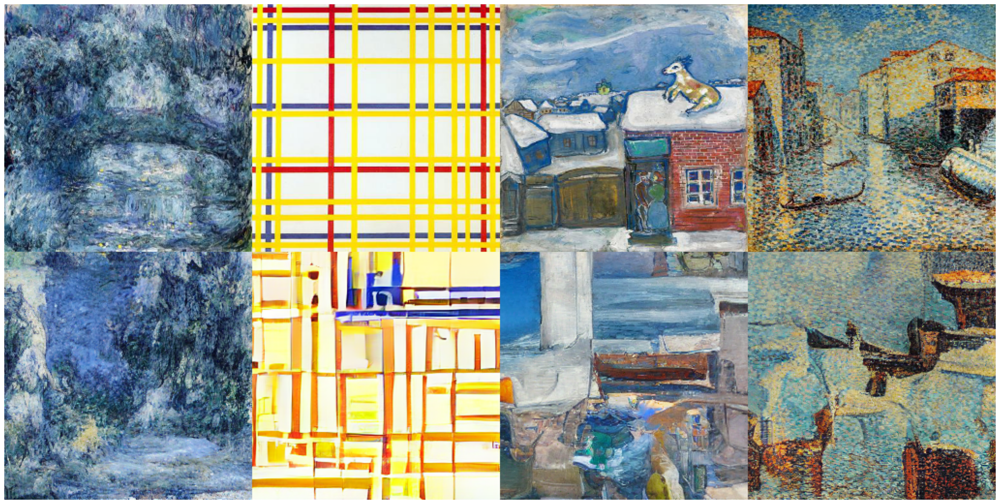

In [16]:
display_samples(x, figsize=(30, 100), n_columns=4)

## 2-Dim Guidance

In [25]:
style_image_path = '/ssd_data/datasets/self_styletransfer_2/style/Claude_Monet_73.jpg'
content_image_path = '/ssd_data/datasets/self_styletransfer_2/content/notebook-styletransfer-bigben.jpg'

with model.ema_scope("Plotting"):
    style_image = preprocess_image(style_image_path)[None, :].to(DEVICE)
    content_image = preprocess_image(content_image_path)[None, :].to(DEVICE)

    vgg_features = model.vgg(model.vgg_scaling_layer(style_image))
    c_style = model.get_style_features(vgg_features)
    null_style = c_style.clone()
    null_style[:] = model.null_style_vector.weight[0]

    content_encoder_posterior = model.encode_first_stage(content_image)[0]
    content_encoder_posterior = model.get_first_stage_encoding(content_encoder_posterior)
    c_content = model.get_content_features(content_encoder_posterior)
    null_content = torch.zeros_like(c_content)

    c = {'c1': c_content, 'c2': c_style}
    c_null_style = {'c1': c_content, 'c2': null_style}
    c_null_content = {'c1': null_content, 'c2': c_style}

Plotting: Switched to EMA weights
Plotting: Restored training weights


In [26]:
# style_scalers = [0.5, 1., 3., 7., 9.]
# content_scalers = [0.5, 1., 2.]
style_scalers = [0.15, 0.5, 1., 3., 5.]
content_scalers = [0.25, 0.5, 1.0, 2.0, 4.0]
samples = list()
x_T = torch.randn_like(content_encoder_posterior)
with model.ema_scope("Plotting"):
    for style_s in style_scalers:
        for content_s in content_scalers:
            sample = model.sample_log(
                cond=c, batch_size=1, ddim=True,
                ddim_steps=DDIM_STEPS, eta=1.,
                x_T=x_T,
                unconditional_guidance_scale=content_s, unconditional_conditioning=c_null_content,
                unconditional_guidance_scale_2=style_s, unconditional_conditioning_2=c_null_style)[0]
            samples.append(sample)
samples = torch.cat(samples, dim=0)
x_samples = model.decode_first_stage(samples)
x_samples = tensor_to_rgb(x_samples)

Plotting: Switched to EMA weights
Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 77.02it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 79.45it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 80.36it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 77.09it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 76.46it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 77.58it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 79.60it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 80.37it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 79.61it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 80.07it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 78.43it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 78.03it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 82.58it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 80.21it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 79.61it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 78.87it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 74.89it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 74.30it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 77.55it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 76.01it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 74.69it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 77.08it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 78.02it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 79.17it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 78.21it/s]

Plotting: Restored training weights


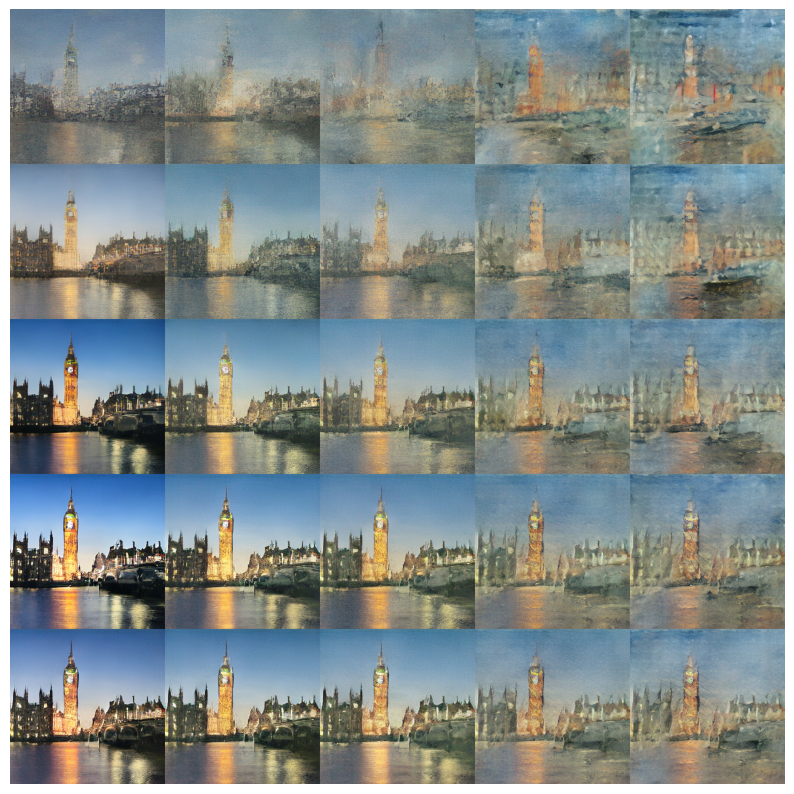

In [39]:
x_images = display_samples(x_samples, n_columns=len(style_scalers))

In [42]:
res = 256
col, row = 2, 0
x_images.crop((res * col, res * row, res * (col + 1), res * (row + 1))).save('../results/bigban_1.jpg')

In [25]:
style_image_path = '/ssd_data/datasets/self_styletransfer_2/content/notebook-styletransfer-bigben.jpg'
content_image_path = '/ssd_data/datasets/self_styletransfer_2/content/notebook-styletransfer-bigben.jpg'

with model.ema_scope("Plotting"):
    style_image = preprocess_image(style_image_path)[None, :].to(DEVICE)
    content_image = preprocess_image(content_image_path, big=True)[None, :].to(DEVICE)

    vgg_features = model.vgg(model.vgg_scaling_layer(style_image))
    c_style = model.get_style_features(vgg_features)
    null_style = c_style.clone()
    null_style[:] = model.null_style_vector.weight[0]

    content_encoder_posterior = model.encode_first_stage(content_image)[0]
    content_encoder_posterior = model.get_first_stage_encoding(content_encoder_posterior)
    c_content = model.get_content_features(content_encoder_posterior)
    null_content = torch.zeros_like(c_content)

    c = {'c1': c_content, 'c2': c_style}
    c_null_style = {'c1': c_content, 'c2': null_style}
    c_null_content = {'c1': null_content, 'c2': c_style}

Plotting: Switched to EMA weights
Plotting: Restored training weights


In [26]:
# style_scalers = [0.5, 1., 3., 7., 9.]
# content_scalers = [0.5, 1., 2.]
# style_scalers = [0.15, 0.5, 1., 3., 5.]
# content_scalers = [0.25, 0.5, 1.0, 2.0, 4.0]
style_scalers = [1.]
content_scalers = [0.25, 0.5, 1.0, 2.0, 4.0]
samples = list()
x_T = torch.randn_like(content_encoder_posterior)
with torch.no_grad():
    with model.ema_scope("Plotting"):
        for style_s in style_scalers:
            for content_s in content_scalers:
                sample = model.sample_log(
                    cond=c, batch_size=1, ddim=True,
                    ddim_steps=DDIM_STEPS, eta=1.,
                    x_T=x_T,
                    unconditional_guidance_scale=content_s, unconditional_conditioning=c_null_content,
                    unconditional_guidance_scale_2=style_s, unconditional_conditioning_2=c_null_style)[0]
                samples.append(sample)
    samples = torch.cat(samples, dim=0)
    x_samples = model.decode_first_stage(samples)
    x_samples = tensor_to_rgb(x_samples)

Plotting: Switched to EMA weights
Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:04<00:00, 60.12it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:04<00:00, 60.51it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:03<00:00, 71.58it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:04<00:00, 60.45it/s]


Data shape for DDIM sampling is (1, 16, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████████████████████████████| 250/250 [00:04<00:00, 60.85it/s]


Plotting: Restored training weights


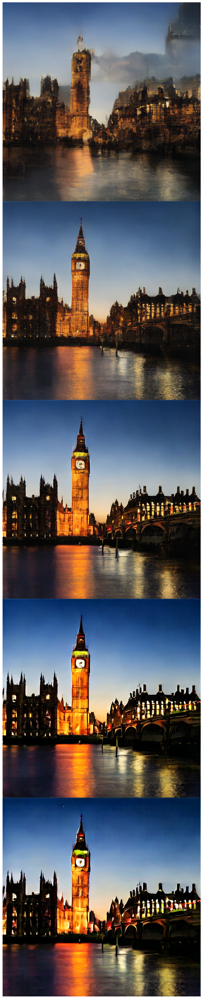

In [27]:
x_images = display_samples(x_samples, n_columns=len(style_scalers))

In [28]:
res = 512
col, row = 0, 2
x_images.crop((res * col, res * row, res * (col + 1), res * (row + 1))).save('../results/bigban_9.jpg')

## Content Leak

In [34]:
style_image_path = '/ssd_data/datasets/self_styletransfer_2/style/7eea9b3caa56fbc72df31807dd34fd1e.jpg'
content_image_path = '/ssd_data/datasets/self_styletransfer_2/content/Leonardo_da_Vinci_121.jpg'

style_image = preprocess_image(style_image_path)[None, :].to(DEVICE)
content_image = preprocess_image(content_image_path)[None, :].to(DEVICE)

style_features = model.encode_first_stage(style_image)[1]
c_style = model.get_style_features(style_features)
null_style = c_style.clone()
null_style[:] = model.null_style_vector.weight[0]

content_encoder_posterior = model.encode_first_stage(content_image)[0]
content_encoder_posterior = model.get_first_stage_encoding(content_encoder_posterior)
c_content = model.get_content_features(content_encoder_posterior)
null_content = torch.zeros_like(c_content)

In [36]:
n_iters = 10
log_every_n_iters = 2
content_s = 1.
style_s = 1.
c_null_content = {'c1': null_content, 'c2': c_style}
x_samples = list()
with model.ema_scope("Plotting"):
    for i in range(n_iters):
        c = {'c1': c_content, 'c2': c_style}
        c_null_style = {'c1': c_content, 'c2': null_style}
        
        sample = model.sample_log(
            cond=c, batch_size=1, ddim=True,
            ddim_steps=DDIM_STEPS, eta=1.,
            unconditional_guidance_scale=content_s, unconditional_conditioning=c_null_content,
            unconditional_guidance_scale_2=style_s, unconditional_conditioning_2=c_null_style)[0]
        x_sample = model.decode_first_stage(sample)
        if i % log_every_n_iters == 0:
            x_samples.append(x_sample)
        content_encoder_posterior = model.encode_first_stage(x_sample)[0]
        content_encoder_posterior = model.get_first_stage_encoding(content_encoder_posterior)
        c_content = model.get_content_features(content_encoder_posterior)
x_samples.append(x_sample)
x_samples = torch.cat(x_samples, dim=0)
x_samples = tensor_to_rgb(x_samples)

Plotting: Switched to EMA weights
Data shape for DDIM sampling is (1, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:03<00:00, 73.38it/s]


Data shape for DDIM sampling is (1, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:03<00:00, 73.55it/s]


Data shape for DDIM sampling is (1, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:03<00:00, 73.78it/s]


Data shape for DDIM sampling is (1, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:03<00:00, 74.13it/s]


Data shape for DDIM sampling is (1, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:03<00:00, 73.87it/s]


Data shape for DDIM sampling is (1, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:03<00:00, 74.13it/s]


Data shape for DDIM sampling is (1, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:03<00:00, 74.43it/s]


Data shape for DDIM sampling is (1, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:03<00:00, 74.72it/s]


Data shape for DDIM sampling is (1, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:03<00:00, 74.96it/s]


Data shape for DDIM sampling is (1, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:03<00:00, 73.92it/s]

Plotting: Restored training weights


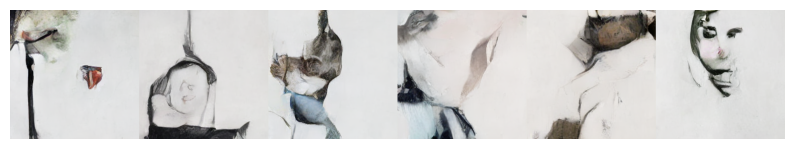

In [37]:
display_samples(x_samples, n_columns=len(x_samples))

## Content

In [5]:
style_image_path = '/ssd_data/datasets/self_styletransfer_2/style/7eea9b3caa56fbc72df31807dd34fd1e.jpg'
content_image_path = '/ssd_data/datasets/self_styletransfer_2/content/Andy_Warhol_28.jpg'

style_image = preprocess_image(style_image_path)[None, :].to(DEVICE)
content_image = preprocess_image(content_image_path)[None, :].to(DEVICE)

style_features = model.encode_first_stage(style_image)[1]
c_style = model.get_style_features(style_features)
null_style = c_style.clone()
null_style[:] = model.null_style_vector.weight[0]

content_encoder_posterior = model.encode_first_stage(content_image)[0]
content_encoder_posterior = model.get_first_stage_encoding(content_encoder_posterior)
c_content = model.get_content_features(content_encoder_posterior)
null_content = torch.zeros_like(c_content)
c = {'c1': c_content, 'c2': c_style}
c_null_style = {'c1': c_content, 'c2': null_style}
c_null_content = {'c1': null_content, 'c2': c_style}

In [7]:
content_s = 1.
style_s = 1.
with model.ema_scope("Plotting"):
    sample = model.sample_log(
            cond=c, batch_size=1, ddim=True,
            ddim_steps=DDIM_STEPS, eta=1.,
            unconditional_guidance_scale=content_s, unconditional_conditioning=c_null_content,
            unconditional_guidance_scale_2=style_s, unconditional_conditioning_2=c_null_style)[0]
    x_sample = model.decode_first_stage(sample)

x_sample = tensor_to_rgb(x_sample)
style = tensor_to_rgb(style_image)
content = tensor_to_rgb(content_image)

x_sample = torch.cat([content, style, x_sample], dim=-1)

Plotting: Switched to EMA weights
Data shape for DDIM sampling is (1, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████| 250/250 [00:03<00:00, 73.46it/s]

Plotting: Restored training weights


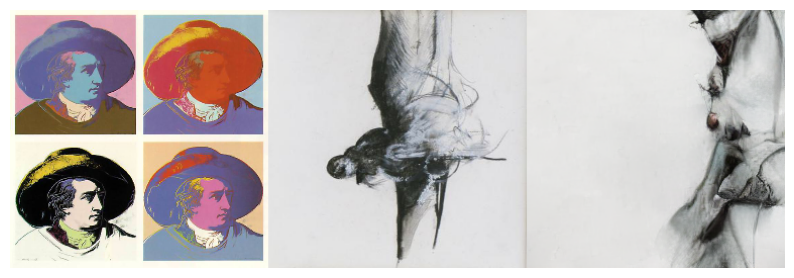

In [8]:
display_samples(x_sample, n_columns=1)

## Style Transfer

In [9]:
style_image_paths = [
    '/ssd_data/datasets/self_styletransfer_2/style/2aa38c9395a45565aede0c53a1c863c4.jpg',
    '/ssd_data/datasets/self_styletransfer_2/style/7eea9b3caa56fbc72df31807dd34fd1e.jpg',
    '/ssd_data/datasets/self_styletransfer_2/style/739c044bad1de04272a89c3c19539691c.jpg',
    '/ssd_data/datasets/self_styletransfer_2/style/7cc3ee4e57e0e66a04527b28975ab033.jpg',
]
content_image_paths = [
    '/ssd_data/datasets/self_styletransfer_2/content/Andy_Warhol_28.jpg',
    '/ssd_data/datasets/self_styletransfer_2/content/00b76096906f41b118b37954106c9ed3c.jpg',
    '/ssd_data/datasets/self_styletransfer_2/content/GoldenGateBridge-001.jpg',
    '/ssd_data/datasets/self_styletransfer_2/content/brad_pitt.jpg',
]
assert len(style_image_paths) == len(content_image_paths)

style_images = torch.stack([preprocess_image(p) for p in style_image_paths], dim=0).to(DEVICE)
content_images = torch.stack([preprocess_image(p) for p in content_image_paths], dim=0).to(DEVICE)

style_features = model.encode_first_stage(style_images)[1]
content_encoder_posterior = model.encode_first_stage(content_images)[0]
content_encoder_posterior = model.get_first_stage_encoding(content_encoder_posterior)

c_style = model.get_style_features(style_features)
null_style = c_style.clone()
null_style[:] = model.null_style_vector.weight[0]

c_content = model.get_content_features(content_encoder_posterior)
null_content = torch.zeros_like(c_content)

c = {'c1': c_content, 'c2': c_style}
c_null_style = {'c1': c_content, 'c2': null_style}
c_null_content = {'c1': null_content, 'c2': c_style}

In [12]:
content_s = 1.
style_s = 1.
with model.ema_scope("Plotting"):
    samples = model.sample_log(
            cond=c, batch_size=len(c_content), ddim=True,
            ddim_steps=DDIM_STEPS, eta=1.,
            unconditional_guidance_scale=content_s, unconditional_conditioning=c_null_content,
            unconditional_guidance_scale_2=style_s, unconditional_conditioning_2=c_null_style)[0]
    x_samples = model.decode_first_stage(samples)

    
x_samples = tensor_to_rgb(x_samples)
styles = tensor_to_rgb(style_images)
contents = tensor_to_rgb(content_images)

x_samples = torch.cat([contents, styles, x_samples], dim=-1)

Plotting: Switched to EMA weights
Data shape for DDIM sampling is (4, 32, 16, 16), eta 1.0
Running DDIM Sampling with 250 timesteps


DDIM Sampler: 100%|███████████████████████████| 250/250 [00:03<00:00, 67.55it/s]

Plotting: Restored training weights


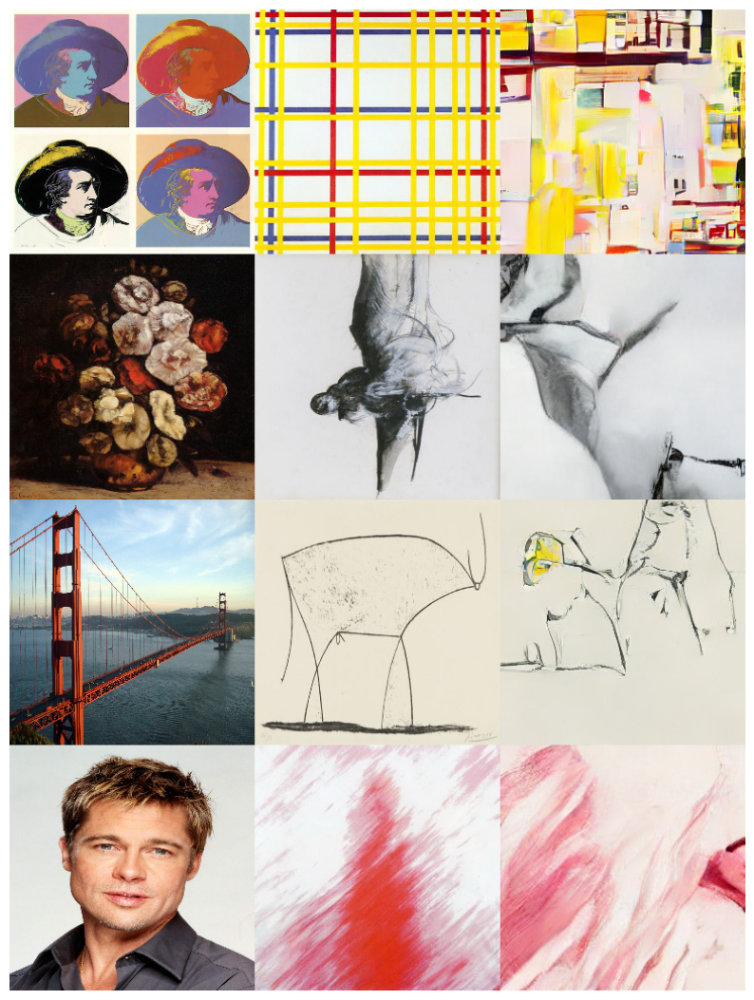

In [13]:
display_samples(x_samples, n_columns=1)